Welcome to my NYC Ride Times project! In this project, we are building a model to predict the duration of taxi trips in New York City.

In our data, we have the following columns:

id : a unique identifier for each trip

vendor_id : provider associated with the trip

pickup_datetime : the date and time the taxi ride meter was engaged

dropoff_datetime : the date and time the taxi ride meter was disengaged

passenger_count : number of passengers

pickup_longitude : longitude the meter was engaged

pickup_latitude : latitude the meter was engaged

dropoff_longitude : longitutde the meter was disengaged

dropoff_latitutde : latitude the meter was disengaged

store_and_fwd_flag : indicates whether the trip was held in vehicle memory before sending to the vendor because the vehicle did not have a connection to the server

trip_duration : duration of trip in seconds


dropoff_datetime and trip_duration are only available in the train set. 

Now let's take a closer look at the data. First, lets load our data frames.

In [36]:
import pandas as pd

train = pd.read_csv('./Data/train.csv')
test = pd.read_csv('./Data/test.csv')

Now lets print the first few rows of our dataset to get a better idea of what we're working with.

In [37]:
train.head(5)

,id,vendor_id,pickup_datetime,dropoff_datetime,passenger_count,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,store_and_fwd_flag,trip_duration
0,id2875421,2,2016-03-14 17:24:55,2016-03-14 17:32:30,1,-73.982155,40.767937,-73.964630,40.765602,N,455
1,id2377394,1,2016-06-12 00:43:35,2016-06-12 00:54:38,1,-73.980415,40.738564,-73.999481,40.731152,N,663
2,id3858529,2,2016-01-19 11:35:24,2016-01-19 12:10:48,1,-73.979027,40.763939,-74.005333,40.710087,N,2124
3,id3504673,2,2016-04-06 19:32:31,2016-04-06 19:39:40,1,-74.010040,40.719971,-74.012268,40.706718,N,429
4,id2181028,2,2016-03-26 13:30:55,2016-03-26 13:38:10,1,-73.973053,40.793209,-73.972923,40.782520,N,435


Now, let's clean some of this data. First, lets set the pickup_datetime and dropoff_datetime columns to be pandas' datetime format.

In [38]:
train['pickup_datetime'] = pd.to_datetime(train.pickup_datetime)
test['pickup_datetime'] = pd.to_datetime(test.pickup_datetime)

train['dropoff_datetime'] = pd.to_datetime(train.dropoff_datetime)

Okay cool! No we are going to add a pickup_date column. Sometimes the date itself is more important than the time of day (think weekends, holidays, etc.)

In [39]:
import datetime as dt
train['pickup_date'] = train['pickup_datetime'].dt.date
test['pickup_date'] = test['pickup_datetime'].dt.date
train['dropoff_date'] = train['dropoff_datetime'].dt.date

train.head(5)

,id,vendor_id,pickup_datetime,dropoff_datetime,passenger_count,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,store_and_fwd_flag,trip_duration,pickup_date,dropoff_date
0,id2875421,2,2016-03-14 17:24:55,2016-03-14 17:32:30,1,-73.982155,40.767937,-73.964630,40.765602,N,455,2016-03-14,2016-03-14
1,id2377394,1,2016-06-12 00:43:35,2016-06-12 00:54:38,1,-73.980415,40.738564,-73.999481,40.731152,N,663,2016-06-12,2016-06-12
2,id3858529,2,2016-01-19 11:35:24,2016-01-19 12:10:48,1,-73.979027,40.763939,-74.005333,40.710087,N,2124,2016-01-19,2016-01-19
3,id3504673,2,2016-04-06 19:32:31,2016-04-06 19:39:40,1,-74.010040,40.719971,-74.012268,40.706718,N,429,2016-04-06,2016-04-06
4,id2181028,2,2016-03-26 13:30:55,2016-03-26 13:38:10,1,-73.973053,40.793209,-73.972923,40.782520,N,435,2016-03-26,2016-03-26


So now, lets try plotting some stuff. First, we can start with the trip duration.

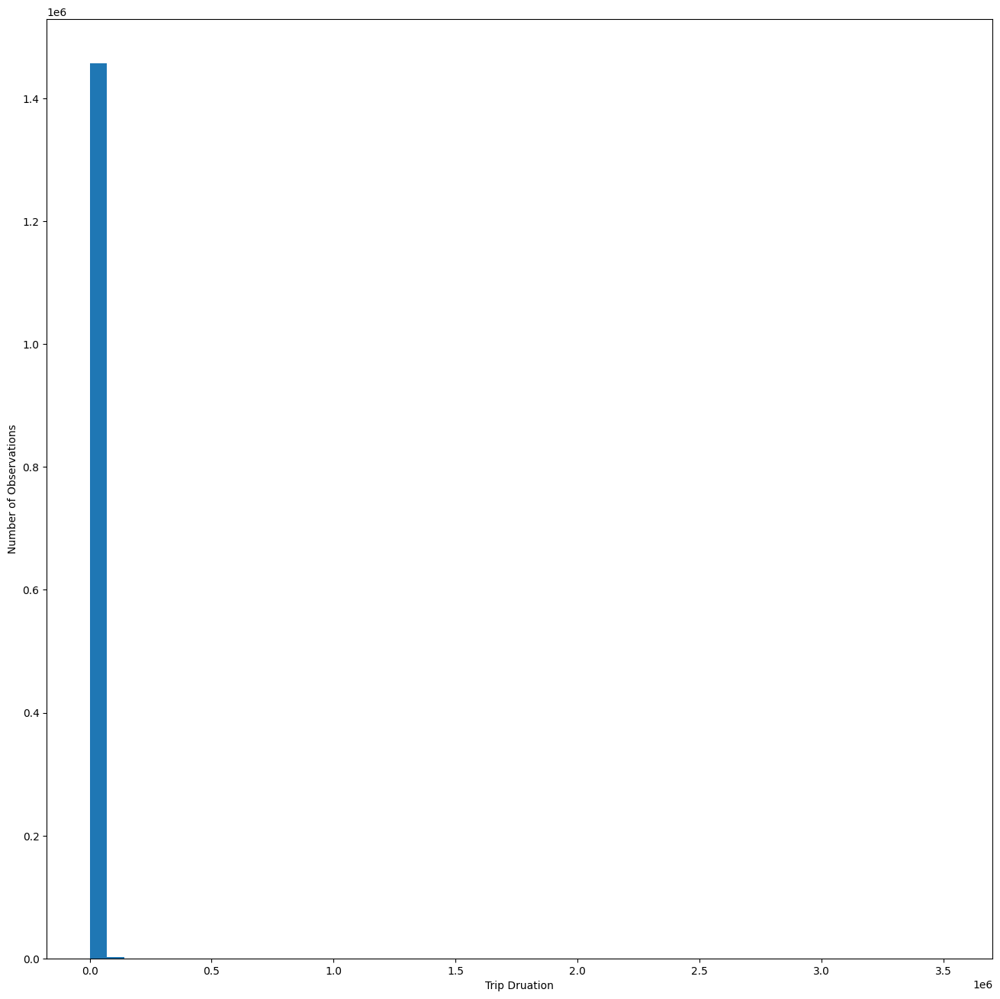

In [40]:
import matplotlib.pyplot as plt
plt.rcParams['figure.figsize'] = [16, 16]

plt.hist(train['trip_duration'].values, bins=50)
plt.xlabel('Trip Druation')
plt.ylabel('Number of Observations')
plt.show()

Hmmmmm, that doesn't look right. Lets try logging the data. That might help.

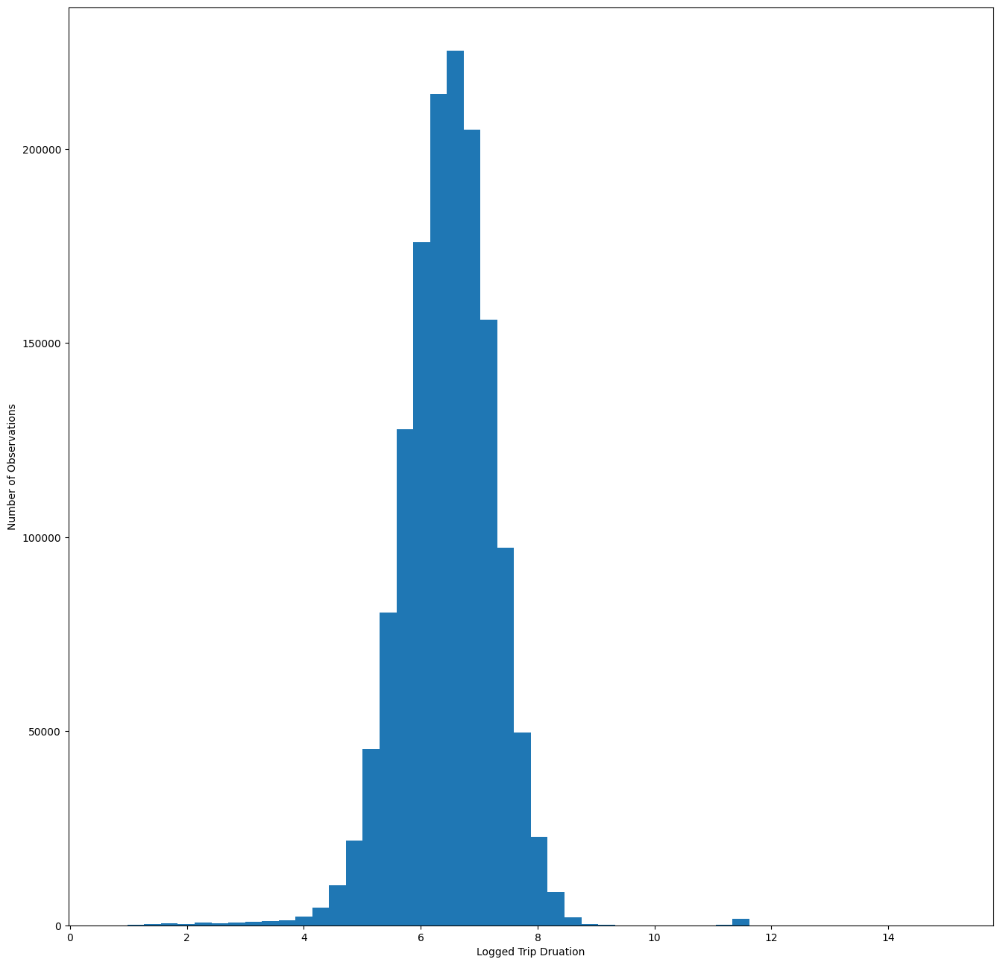

In [41]:
import numpy as np
train['log_tripduration'] = np.log(train['trip_duration'].values + 1)
plt.hist(train['log_tripduration'].values, bins=50)
plt.xlabel('Logged Trip Druation')
plt.ylabel('Number of Observations')
plt.show()

That's so much better! Lets look at pickup longitude and latitude.

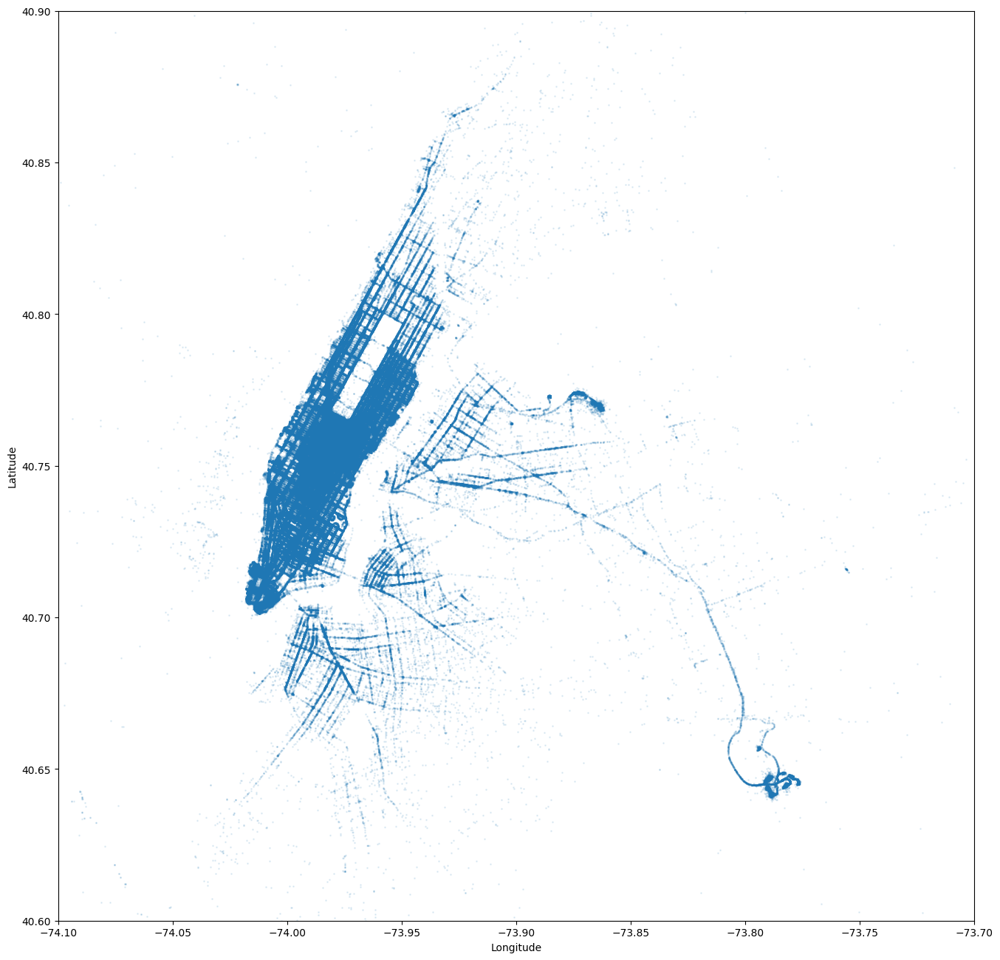

In [42]:
plt.scatter(train['pickup_longitude'].values, train['pickup_latitude'].values, s=1, alpha=0.1)
plt.ylim((40.6, 40.9))
plt.xlim((-74.1, -73.7))
plt.ylabel('Latitude')
plt.xlabel('Longitude')
plt.show()

Would you look at that. That's a pretty neat outlne of the streets of NYC!

Lets try dropoffs.

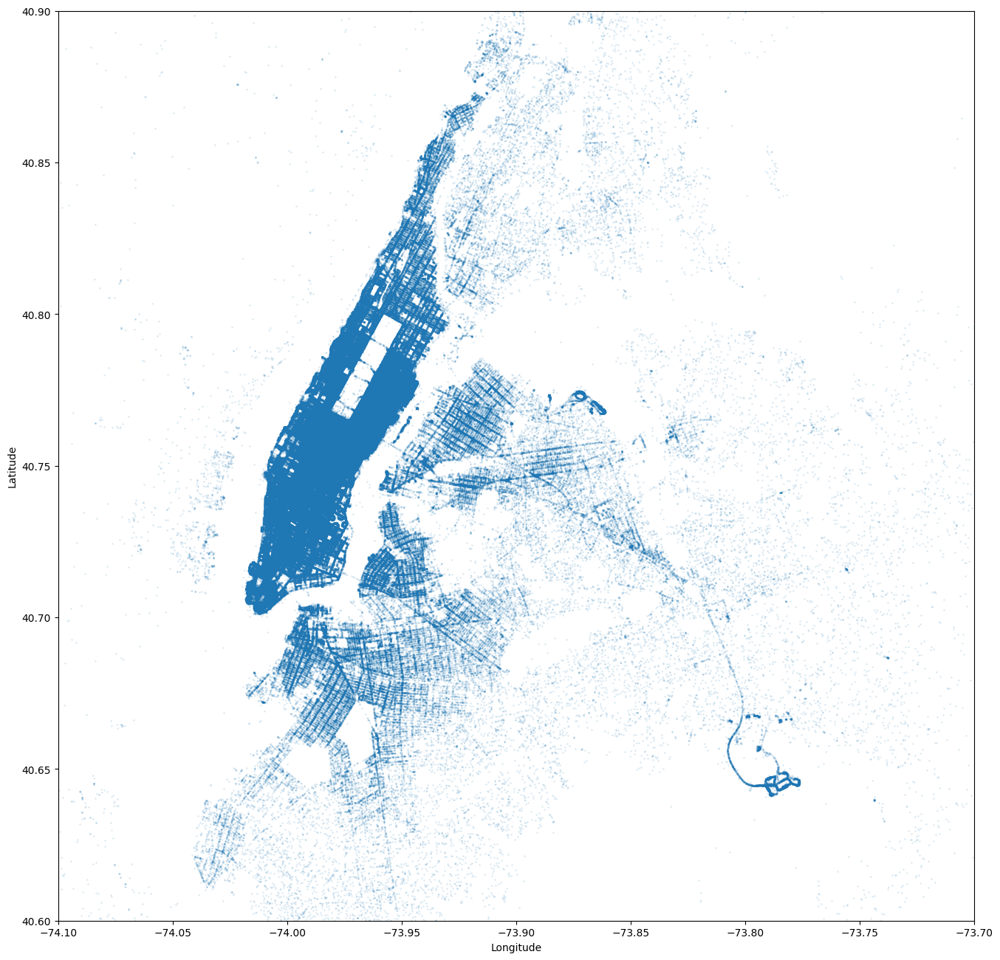

In [43]:
plt.scatter(train['dropoff_longitude'].values, train['dropoff_latitude'].values, s=1, alpha=0.1)
plt.ylim((40.6, 40.9))
plt.xlim((-74.1, -73.7))
plt.ylabel('Latitude')
plt.xlabel('Longitude')
plt.show()

Now lets look at some others. Lets try the date of pickup.

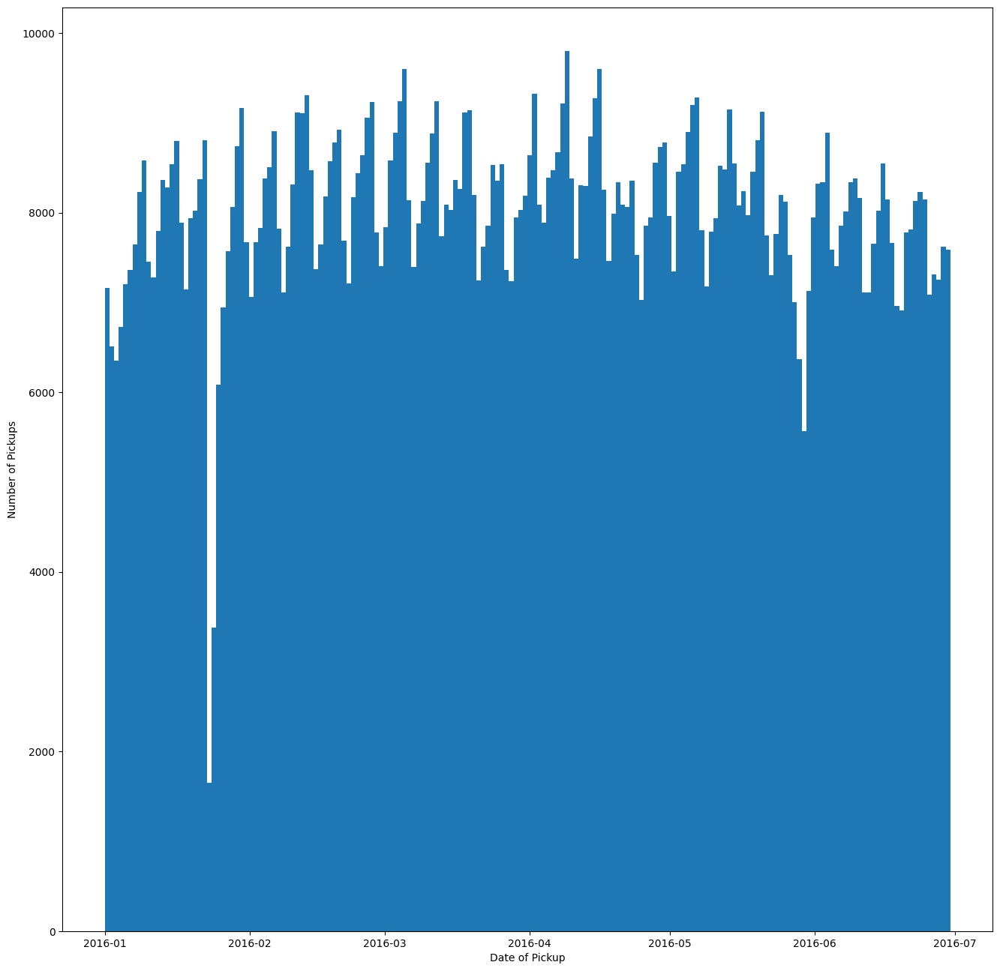

In [44]:
plt.hist(train['pickup_date'].values, bins=182)
plt.xlabel('Date of Pickup')
plt.ylabel('Number of Pickups')
plt.show()

Now let's try pickup time.

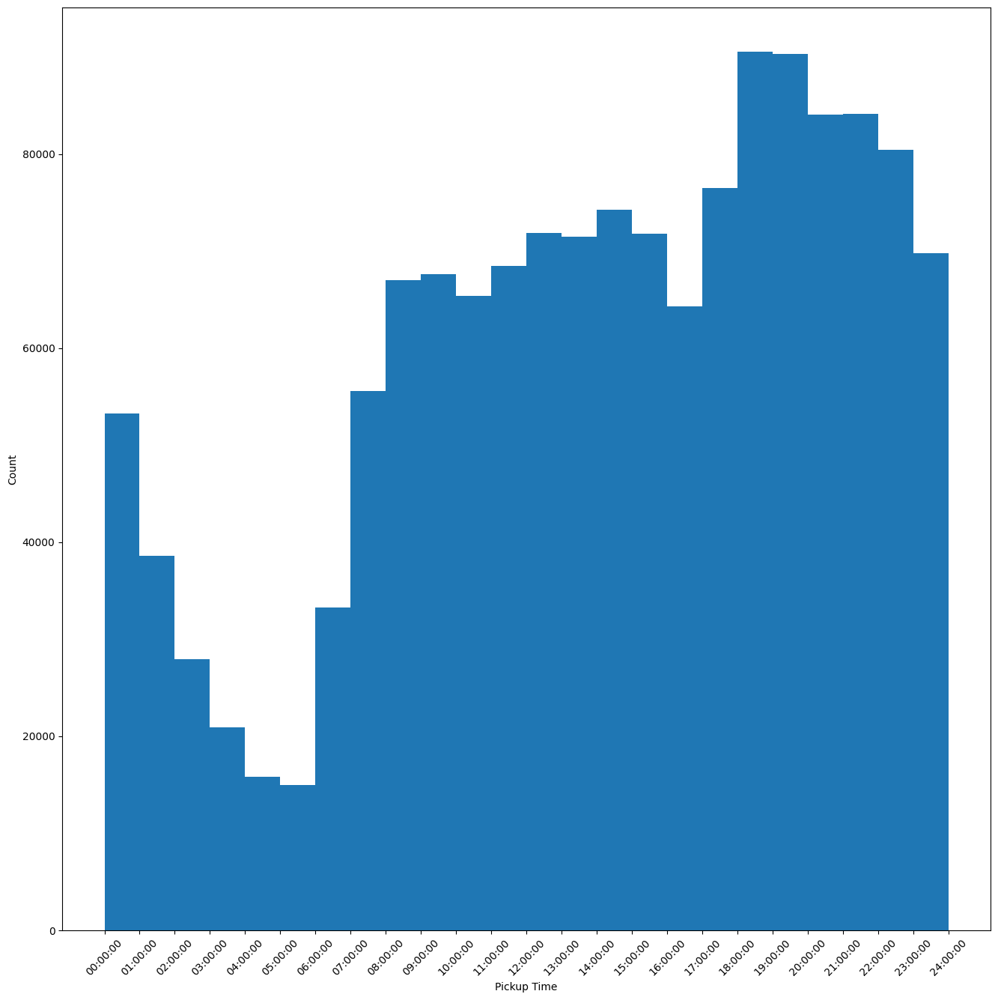

In [45]:
import datetime

# Calculate the number of seconds between normalized pickup_datetime and pickup_datetime.
# This is done by converting the resulting timedelta to the total number of seconds from midnight.
train['pickup_time_seconds'] = (train['pickup_datetime'] - train['pickup_datetime'].dt.normalize()).dt.total_seconds()
test['pickup_time_seconds'] = (test['pickup_datetime'] - test['pickup_datetime'].dt.normalize()).dt.total_seconds()
train['dropoff_time_seconds'] = (train['dropoff_datetime'] - train['dropoff_datetime'].dt.normalize()).dt.total_seconds()


plt.hist(train['pickup_time_seconds'].values, bins=24)
plt.xticks([i*3600 for i in range(25)], [f'{i:02d}:00:00' for i in range(24)] + ['24:00:00'], rotation=45)
plt.xlabel('Pickup Time')
plt.ylabel('Count')
plt.show()

As we can see, there is a lot of interesting information we can use.

Next, we will calculate the distance between dropoff and pickup points. 

In [46]:
# Calculate Haversine
def haversine_array(lat1, lng1, lat2, lng2):
    lat1, lng1, lat2, lng2 = map(np.radians, (lat1, lng1, lat2, lng2))
    AVG_EARTH_RADIUS = 6371  # in km
    lat = lat2 - lat1
    lng = lng2 - lng1
    d = np.sin(lat * 0.5) ** 2 + np.cos(lat1) * np.cos(lat2) * np.sin(lng * 0.5) ** 2
    h = 2 * AVG_EARTH_RADIUS * np.arcsin(np.sqrt(d))
    return h

# Calculate Manhattan distance
def dummy_manhattan_distance(lat1, lng1, lat2, lng2):
    a = haversine_array(lat1, lng1, lat1, lng2)
    b = haversine_array(lat1, lng1, lat2, lng1)
    return a + b

# Calculate bearing of the route
def bearing_array(lat1, lng1, lat2, lng2):
    AVG_EARTH_RADIUS = 6371  # in km
    lng_delta_rad = np.radians(lng2 - lng1)
    lat1, lng1, lat2, lng2 = map(np.radians, (lat1, lng1, lat2, lng2))
    y = np.sin(lng_delta_rad) * np.cos(lat2)
    x = np.cos(lat1) * np.sin(lat2) - np.sin(lat1) * np.cos(lat2) * np.cos(lng_delta_rad)
    return np.degrees(np.arctan2(y, x))

# make columns for various distances
train['distance_dummy_manhattan'] = dummy_manhattan_distance(train['pickup_latitude'].values, train['pickup_longitude'].values, train['dropoff_latitude'].values, train['dropoff_longitude'].values)
train['direction'] = bearing_array(train['pickup_latitude'].values, train['pickup_longitude'].values, train['dropoff_latitude'].values, train['dropoff_longitude'].values)
train['manhattan'] = np.abs(train['dropoff_latitude'] - train['pickup_latitude']) + np.abs(train['dropoff_longitude'] - train['pickup_longitude'])

test['distance_dummy_manhattan'] = dummy_manhattan_distance(test['pickup_latitude'].values, test['pickup_longitude'].values, test['dropoff_latitude'].values, test['dropoff_longitude'].values)
test['direction'] = bearing_array(test['pickup_latitude'].values, test['pickup_longitude'].values, test['dropoff_latitude'].values, test['dropoff_longitude'].values)
test['manhattan'] = np.abs(test['dropoff_latitude'] - test['pickup_latitude']) + np.abs(test['dropoff_longitude'] - test['pickup_longitude'])

# Calculate the coords for center of the route
train['center_latitude'] = (train['pickup_latitude'].values + train['dropoff_latitude'].values) / 2
train['center_longitude'] = (train['pickup_longitude'].values + train['dropoff_longitude'].values) / 2
test['center_latitude'] = (test['pickup_latitude'].values + test['dropoff_latitude'].values) / 2
test['center_longitude'] = (test['pickup_longitude'].values + test['dropoff_longitude'].values) / 2

Now we want to find some features about the dates

In [47]:
train['pickup_weekday'] = train['pickup_datetime'].dt.weekday
train['pickup_weekofyear'] = train['pickup_datetime'].dt.isocalendar().week
train['pickup_hour'] = train['pickup_datetime'].dt.hour
train['pickup_minute'] = train['pickup_datetime'].dt.minute
train['pickup_dt'] = (train['pickup_datetime'] - train['pickup_datetime'].min()).dt.total_seconds()
train['pickup_week_hour'] = train['pickup_weekday'] * 24 + train['pickup_hour']

test['pickup_weekday'] = test['pickup_datetime'].dt.weekday
test['pickup_weekofyear'] = test['pickup_datetime'].dt.isocalendar().week
test['pickup_hour'] = test['pickup_datetime'].dt.hour
test['pickup_minute'] = test['pickup_datetime'].dt.minute
test['pickup_dt'] = (test['pickup_datetime'] - test['pickup_datetime'].min()).dt.total_seconds()
test['pickup_week_hour'] = test['pickup_weekday'] * 24 + test['pickup_hour']


Now, let's find information about the speed

In [48]:
train['average speed'] = 1000 * train['distance_dummy_manhattan'] / train['trip_duration']

Now, lets make some graphs about the speed.

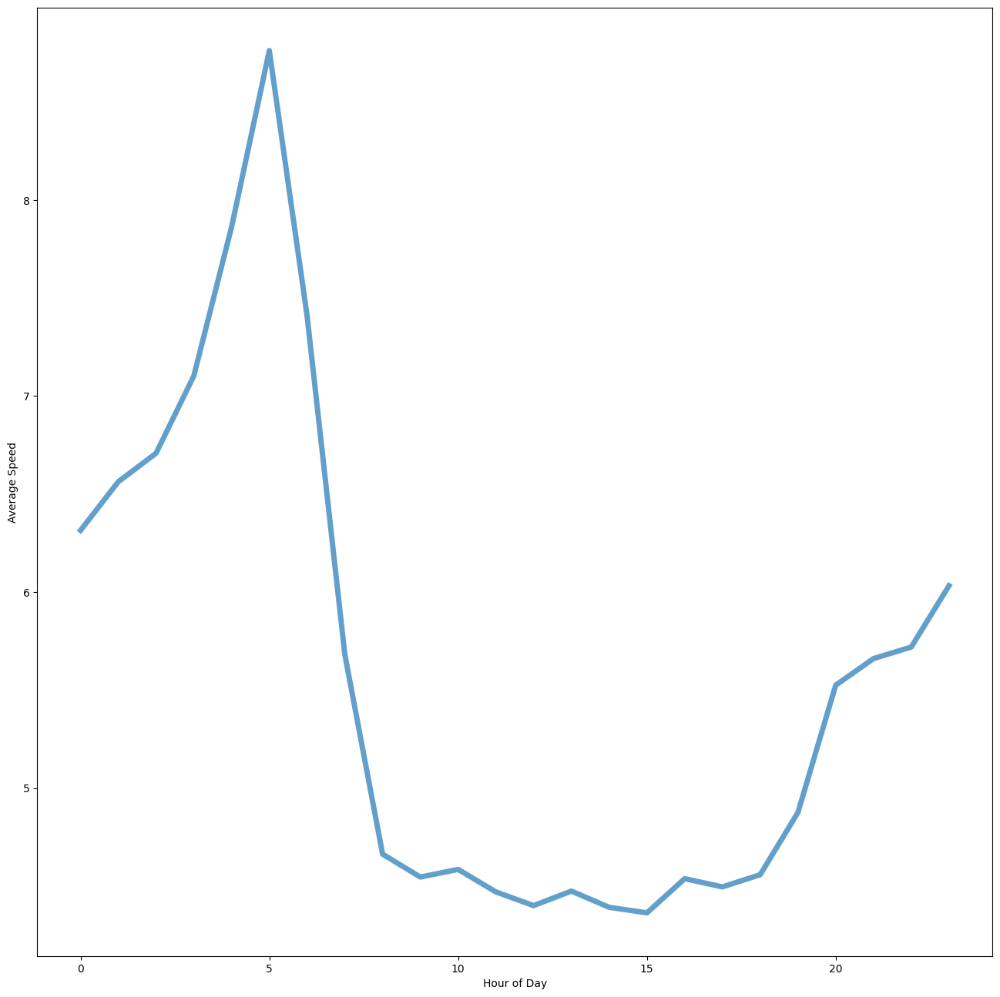

In [49]:
plt.plot(train.groupby('pickup_hour').mean(numeric_only=True)['average speed'], lw=5, alpha=0.7)
plt.xlabel("Hour of Day")
plt.ylabel("Average Speed")
plt.show()

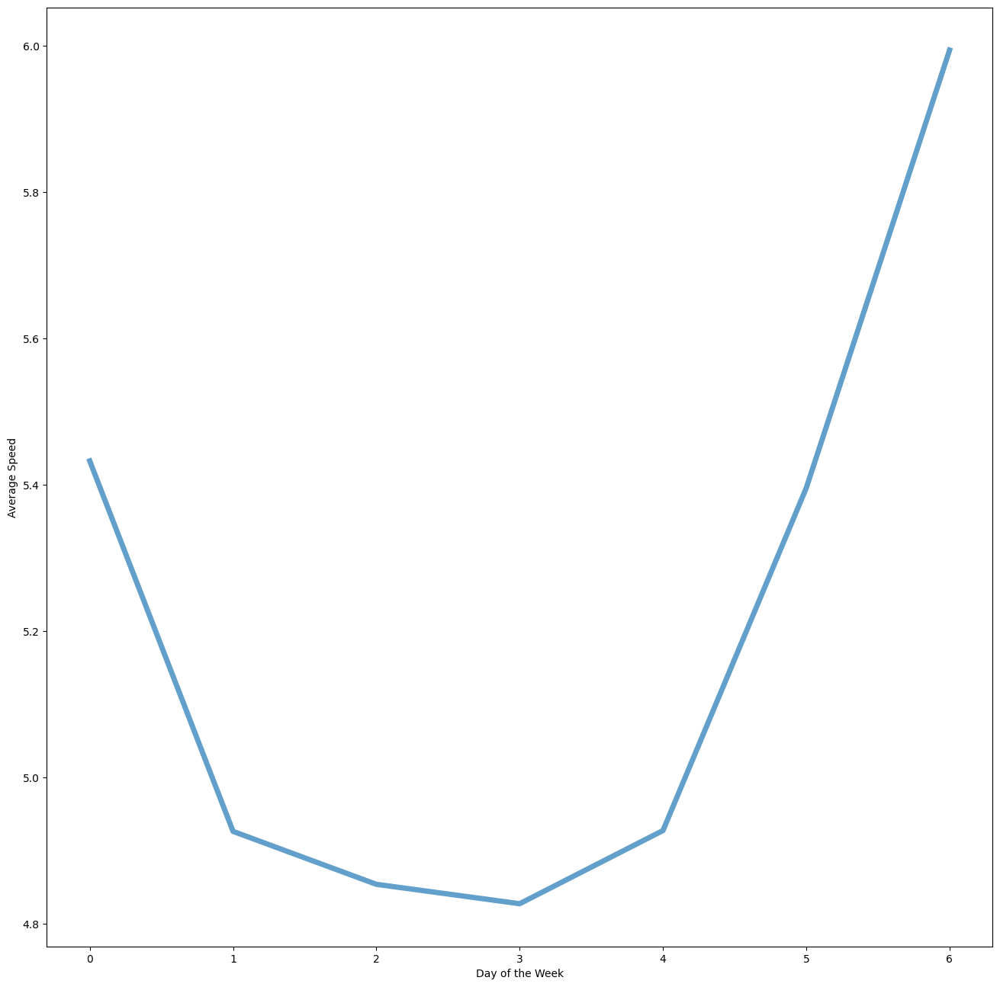

In [50]:
plt.plot(train.groupby('pickup_weekday').mean(numeric_only=True)['average speed'], lw=5, alpha=0.7)
plt.xlabel("Day of the Week")
plt.ylabel("Average Speed")
plt.show()

Now lets find the speed by location of the ride. We can do this in three ways, 1) speed by pickup location, 2) speed by dropoff location, 3) speed by middle of the ride

First, we will do pickup location

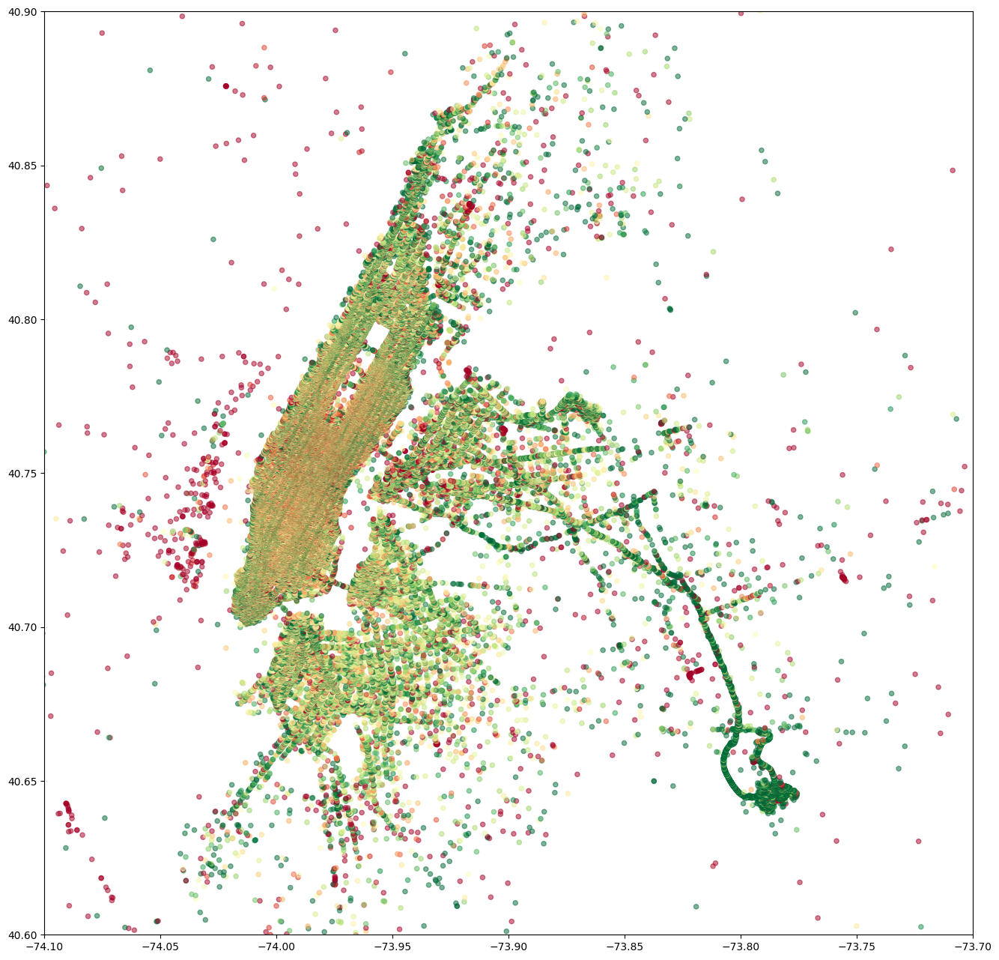

In [51]:
pickup_loc_speed = train.groupby(['pickup_latitude', 'pickup_longitude']).mean(numeric_only=True)[['average speed']].reset_index()
pickup_loc_speed_count = train.groupby(['pickup_latitude', 'pickup_longitude']).count()[['id']].reset_index()
pickup_loc_info = pd.merge(pickup_loc_speed, pickup_loc_speed_count, on=['pickup_latitude', 'pickup_longitude'])

plt.scatter(pickup_loc_info['pickup_longitude'].values, pickup_loc_info['pickup_latitude'].values, c=pickup_loc_info['average speed'].values, cmap='RdYlGn', s=20, alpha=0.5, vmin=1, vmax=8)

plt.ylim((40.6, 40.9))
plt.xlim((-74.1, -73.7))


plt.show()

Now, dropoff location

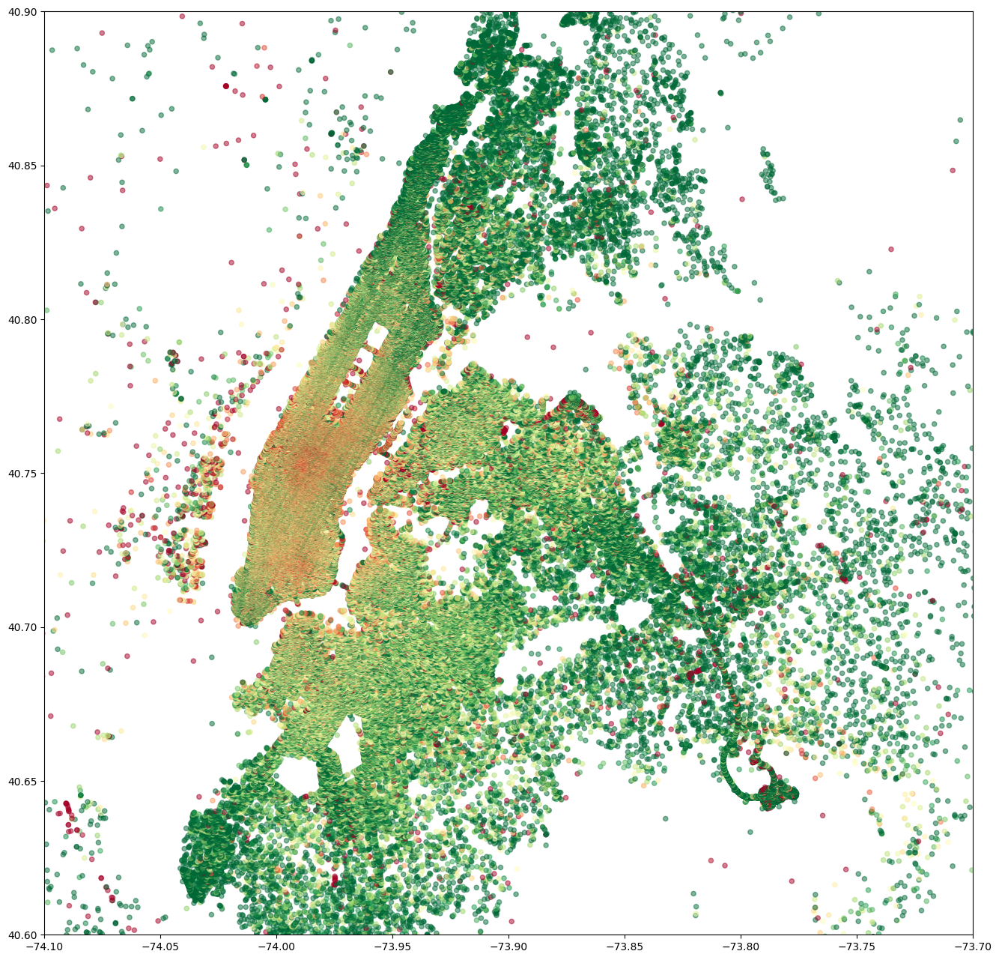

In [52]:
dropoff_loc_speed = train.groupby(['dropoff_latitude', 'dropoff_longitude']).mean(numeric_only=True)[['average speed']].reset_index()
dropoff_loc_speed_count = train.groupby(['dropoff_latitude', 'dropoff_longitude']).count()[['id']].reset_index()
dropoff_loc_info = pd.merge(dropoff_loc_speed, dropoff_loc_speed_count, on=['dropoff_latitude', 'dropoff_longitude'])

plt.scatter(dropoff_loc_info['dropoff_longitude'].values, dropoff_loc_info['dropoff_latitude'].values, c=dropoff_loc_info['average speed'].values, cmap='RdYlGn', s=20, alpha=0.5, vmin=1, vmax=8)

plt.ylim((40.6, 40.9))
plt.xlim((-74.1, -73.7))


plt.show()

Now, center location of the ride

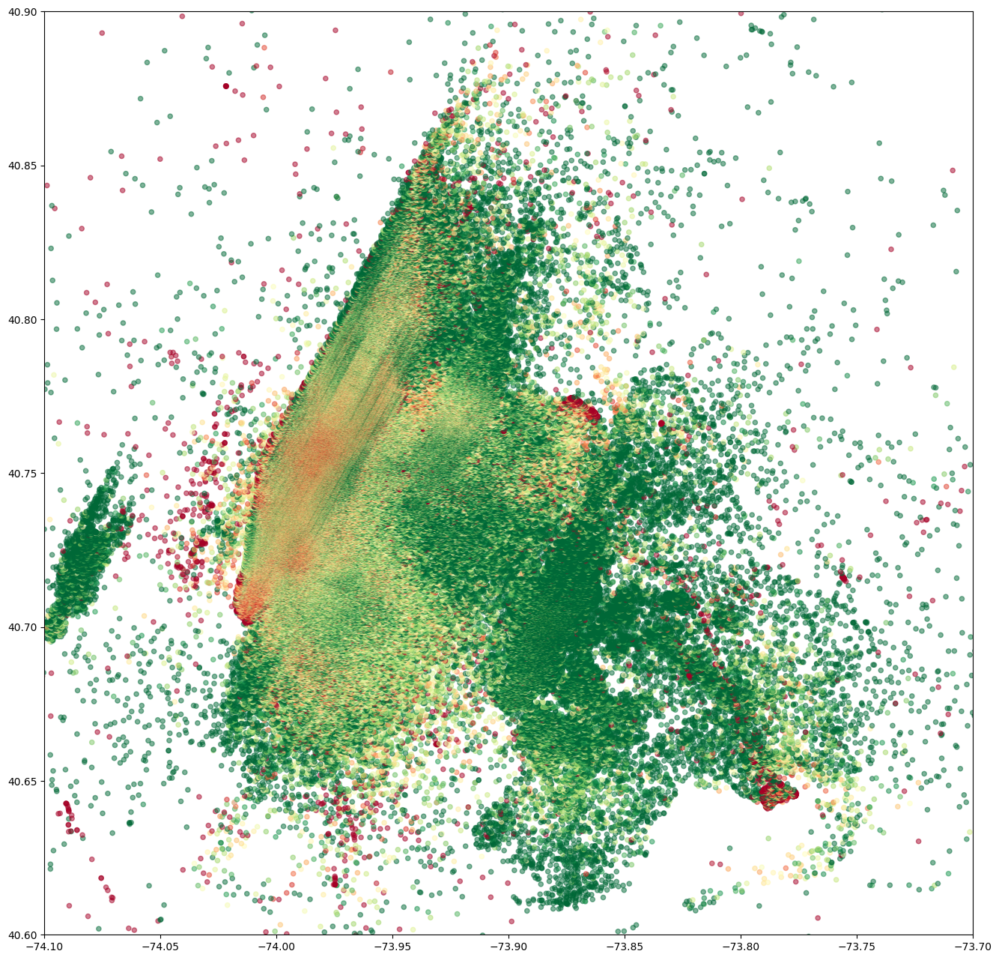

In [53]:
center_loc_speed = train.groupby(['center_latitude', 'center_longitude']).mean(numeric_only=True)[['average speed']].reset_index()
center_loc_speed_count = train.groupby(['center_latitude', 'center_longitude']).count()[['id']].reset_index()
center_loc_info = pd.merge(center_loc_speed, center_loc_speed_count, on=['center_latitude', 'center_longitude'])

plt.scatter(center_loc_info['center_longitude'].values, center_loc_info['center_latitude'].values, c=center_loc_info['average speed'].values, cmap='RdYlGn', s=20, alpha=0.5, vmin=1, vmax=8)

plt.ylim((40.6, 40.9))
plt.xlim((-74.1, -73.7))


plt.show()

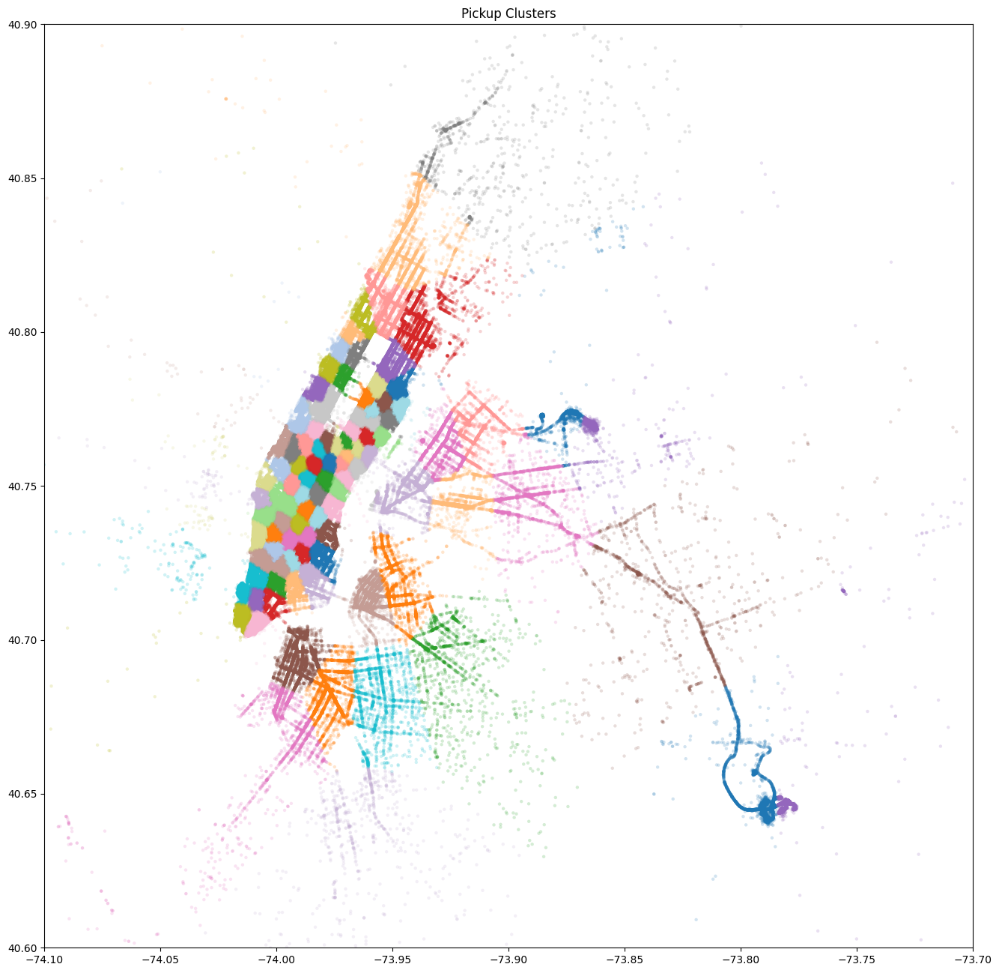

In [54]:
from sklearn.cluster import MiniBatchKMeans

pickup_coords = train[['pickup_latitude', 'pickup_longitude']].values
inds = np.random.permutation(len(pickup_coords))
kmeans = MiniBatchKMeans(n_clusters=100, batch_size=10000, n_init=3)
kmeans.fit(pickup_coords[inds])

train['pickup_cluster'] = kmeans.predict(train[['pickup_latitude', 'pickup_longitude']].values)
test['pickup_cluster'] = kmeans.predict(test[['pickup_latitude', 'pickup_longitude']].values)

plt.scatter(train['pickup_longitude'].values, train['pickup_latitude'].values, s=10, lw=0, c=train['pickup_cluster'], cmap='tab20', alpha=0.2)
plt.ylim((40.6, 40.9))
plt.xlim((-74.1, -73.7))
plt.title('Pickup Clusters')

plt.show()

Let's do dropoffs now

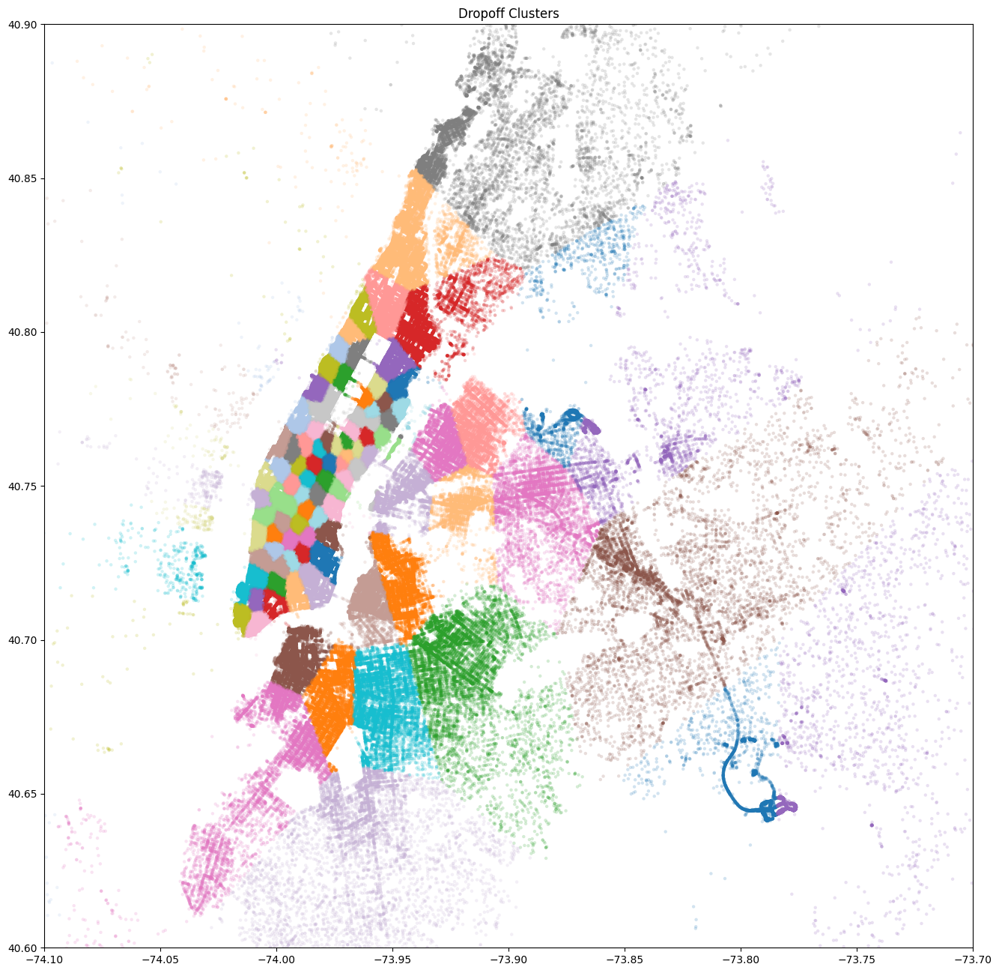

In [55]:
train['dropoff_cluster'] = kmeans.predict(train[['dropoff_latitude', 'dropoff_longitude']].values)
test['dropoff_cluster'] = kmeans.predict(test[['dropoff_latitude', 'dropoff_longitude']].values)

plt.scatter(train['dropoff_longitude'].values, train['dropoff_latitude'].values, s=10, lw=0, c=train['dropoff_cluster'], cmap='tab20', alpha=0.2)
plt.ylim((40.6, 40.9))
plt.xlim((-74.1, -73.7))
plt.title('Dropoff Clusters')

plt.show()

Now, let's look at some traffic speed features.

In [56]:
for col in ['pickup_hour', 'pickup_date', 
            'pickup_dt', 'pickup_week_hour', 
            'pickup_cluster', 'dropoff_cluster']:
    
    # create newinfo dataset calculating the mean of average speed and log_tripduration columns
    newinfo = train.groupby(col).mean(numeric_only=True)[['average speed', 'log_tripduration']]
    
    # create a new column with name "_newinfo_{col}" appended to average speed and log_tripduration
    newinfo.columns = ['%s_newinfo_%s' % (c, col) for c in newinfo.columns]
    
    # merge the columns into test and train
    train = pd.merge(train, newinfo, how='left', left_on=col, right_index=True)
    test = pd.merge(test, newinfo, how='left', left_on=col, right_index=True)


In [57]:
for col in [['center_latitude', 'center_longitude'],
            ['pickup_hour', 'center_latitude', 'center_longitude'],
            ['pickup_hour', 'pickup_cluster'],
            ['pickup_hour', 'dropoff_cluster'],
            ['pickup_cluster', 'dropoff_cluster']]:
    
    # create speed dataset that groups columns and calculates average speed column
    speed = train.groupby(col).mean(numeric_only=True)[['average speed']].reset_index()
    
    # create count dataset that groups columns and calculates the count of id column
    count = train.groupby(col).count()[['id']].reset_index()
    
    # merges speed and count dataset
    stats = pd.merge(speed, count, on=col)
    
    # create names for new columns
    stats.columns=col + ['average speed %s' % '_'.join(col), 'cnt_%s' % '_'.join(col)]
    
    # merge the new columns into test and train
    train = pd.merge(train, stats, how='left', on=col)
    test = pd.merge(test, stats, how='left', on=col)

In [58]:
group_freq = '60min'

# create one big dataframe with train and test data of the selected columns
total_df = pd.concat((train, test))[['id', 'pickup_datetime', 'pickup_cluster', 'dropoff_cluster']]

# round pickup times to nearest hour
train['pickup_datetime_group'] = train['pickup_datetime'].dt.round(group_freq)
test['pickup_datetime_group'] = test['pickup_datetime'].dt.round(group_freq)

# dropoff times, this is not available in test set!
train['dropoff_datetime_group'] = train['dropoff_datetime'].dt.round(group_freq)

# new dataframe with index set to pickup_datetime using only id column, sorted by pickup_datetime
df_counts = total_df.set_index('pickup_datetime')[['id']].sort_index()

# create new column with count of pickups in the last hour
df_counts['count_60min'] = df_counts.isnull().rolling(group_freq).count()['id']

# merge info back into train and test dataframes
train = train.merge(df_counts, on='id', how='left')
test = test.merge(df_counts, on='id', how='left')

# Count the number of trips ending in each cluster over time
dropoff_counts = total_df \
    .set_index('pickup_datetime') \
    .groupby([pd.Grouper(freq=group_freq), 'dropoff_cluster']) \
    .agg({'id': 'count'}) \
    .reset_index() \
    .set_index('pickup_datetime') \
    .groupby(['dropoff_cluster', pd.Grouper(freq='240min', label='right', closed='right')]) \
    .agg({'id': 'mean'}) \
    .reset_index() \
    .rename(columns={'pickup_datetime': 'pickup_datetime_group', 'id': 'dropoff_cluster_count'}) \
    .set_index('pickup_datetime_group') \
    .shift(freq='-120min')


train['dropoff_cluster_count'] = train[['pickup_datetime_group', 'dropoff_cluster']].merge(dropoff_counts, on=['pickup_datetime_group', 'dropoff_cluster'], how='left')['dropoff_cluster_count'].fillna(0)
test['dropoff_cluster_count'] = test[['pickup_datetime_group', 'dropoff_cluster']].merge(dropoff_counts, on=['pickup_datetime_group', 'dropoff_cluster'], how='left')['dropoff_cluster_count'].fillna(0)


In [59]:
# Now, we count the number of trips that are originating from each cluster
total_df = pd.concat((train, test))[['id', 'pickup_datetime', 'pickup_cluster', 'dropoff_cluster']]

pickup_counts = total_df \
    .set_index('pickup_datetime') \
    .groupby([pd.Grouper(freq=group_freq), 'pickup_cluster']) \
    .agg({'id': 'count'}) \
    .reset_index() \
    .set_index('pickup_datetime') \
    .groupby(['pickup_cluster', pd.Grouper(freq='240min', label='right', closed='right')]) \
    .agg({'id' : 'mean'}) \
    .reset_index() \
    .rename(columns={'pickup_datetime': 'pickup_datetime_group', 'id': 'pickup_cluster_count'}) \
    .set_index('pickup_datetime_group') \
    .shift(freq='-120min')

train['pickup_cluster_count'] = train[['pickup_datetime_group', 'pickup_cluster']].merge(pickup_counts, on=['pickup_datetime_group', 'pickup_cluster'], how='left')['pickup_cluster_count'].fillna(0)
test['pickup_cluster_count'] = test[['pickup_datetime_group', 'pickup_cluster']].merge(pickup_counts, on=['pickup_datetime_group', 'pickup_cluster'], how='left')['pickup_cluster_count'].fillna(0)

Now, we will do some modelling!

In [60]:
import xgboost as xgb
from sklearn.model_selection import train_test_split

y = np.log(train['trip_duration'].values + 1)
do_not_use = ['id', 'log_tripduration', 'pickup_datetime', 'dropoff_datetime',
              'trip_duration', 'check_trip_duration',
              'pickup_date', 'average speed',
              'pickup_lat_bin', 'pickup_long_bin',
              'center_lat_bin', 'center_long_bin',
              'pickup_dt_bin', 'pickup_datetime_group',
              'dropoff_date', 'dropoff_datetime_group',
              'dropoff_time_seconds']

train['store_and_fwd_flag'] = 1 * (train.store_and_fwd_flag.values == 'Y')
test['store_and_fwd_flag'] = 1 * (test.store_and_fwd_flag.values == 'Y')

feature_names = [f for f in train.columns if f not in do_not_use]

X_train, X_v, y_train, y_v = train_test_split(train[feature_names].values, y, test_size=0.2, random_state=1987)

dtrain = xgb.DMatrix(X_train, label=y_train)
dvalid = xgb.DMatrix(X_v, label=y_v)
dtest = xgb.DMatrix(test[feature_names].values)
watchlist = [(dtrain, 'train'), (dvalid, 'valid')]
xgb_pars = {'min_child_weight': 50, 'eta': 0.3, 'colsample_bytree': 0.3, 'max_depth': 10,
            'subsample': 0.8, 'reg_lambda': 1., 'nthread': 4, 'booster': 'gbtree', 'verbosity': 1,
            'eval_metric': 'rmse', 'objective': 'reg:squarederror'}

model = xgb.train(params=xgb_pars, dtrain=dtrain, num_boost_round=60, evals=watchlist, early_stopping_rounds=50,
                  maximize=False, verbose_eval=10)
print('Modeling RMSLE %.5f' % model.best_score)



[0]	train-rmse:4.22705	valid-rmse:4.22802
[10]	train-rmse:0.17661	valid-rmse:0.18120
[20]	train-rmse:0.09838	valid-rmse:0.10476
[30]	train-rmse:0.08444	valid-rmse:0.09186
[40]	train-rmse:0.07665	valid-rmse:0.08509
[50]	train-rmse:0.06824	valid-rmse:0.07755
[59]	train-rmse:0.06368	valid-rmse:0.07360
Modeling RMSLE 0.07360


Now we have our model trained! Not bad! Lets do some feature analysis.

In [61]:
importance_dict = model.get_fscore()
feature_score = ['f%i' % i for i in range(len(feature_names))]

f1 = pd.DataFrame({'f' : list(importance_dict.keys()),
                   'importance' : list(importance_dict.values())})

f2 = pd.DataFrame({'f' : feature_score, 'feature_name': feature_names})

feature_importance = pd.merge(f1, f2, how='right', on='f').fillna(0)
feature_importance[['feature_name', 'importance']].sort_values(by='importance', ascending=False)

,feature_name,importance
41,average speed pickup_cluster_dropoff_cluster,2169.0
8,distance_dummy_manhattan,1756.0
35,average speed pickup_hour_center_latitude_cent...,1668.0
25,average speed_newinfo_pickup_dt,1586.0
33,average speed center_latitude_center_longitude,1445.0
42,cnt_pickup_cluster_dropoff_cluster,1445.0
26,log_tripduration_newinfo_pickup_dt,1297.0
11,center_latitude,1252.0
9,direction,1180.0
5,dropoff_latitude,1112.0


Now let's graph our predicted values versus our actual values

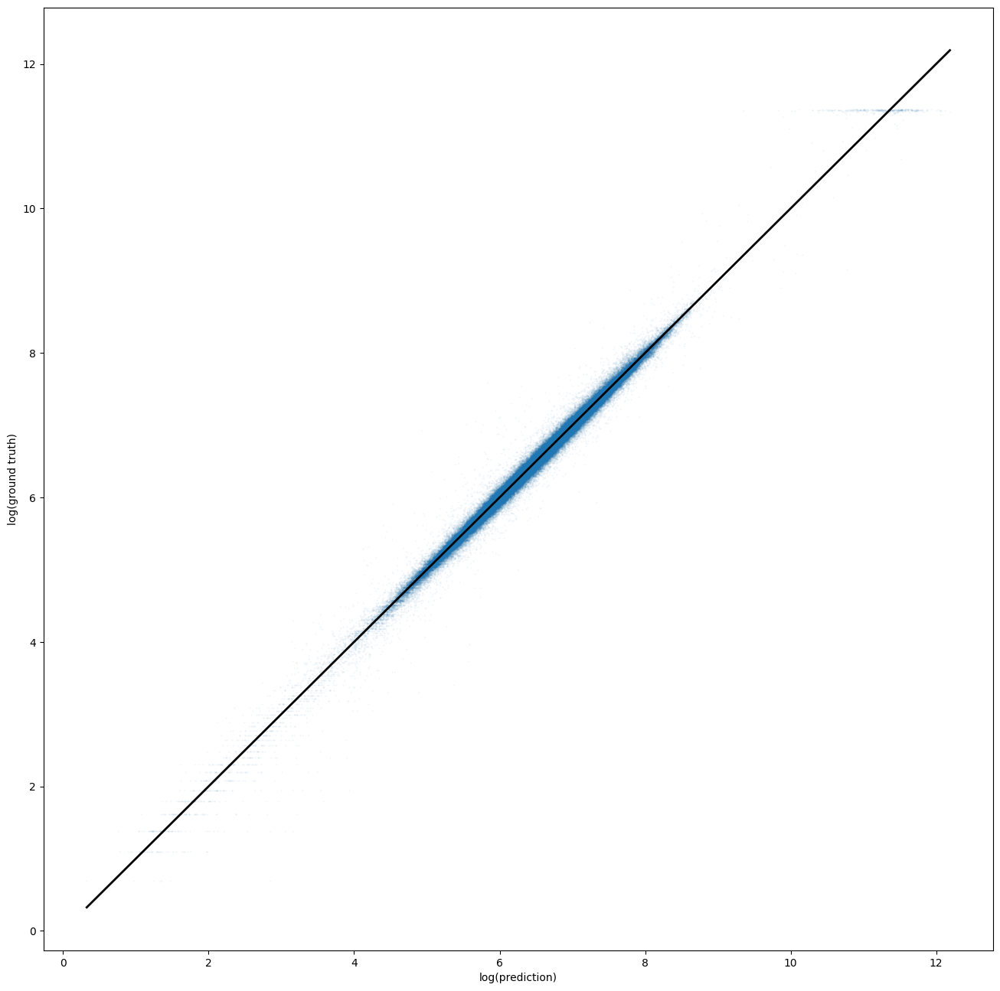

In [62]:
ypred = model.predict(dvalid)

plt.scatter(ypred, y_v, s=0.1, alpha=0.1)
x = np.linspace(min(ypred), max(ypred), 100)
plt.plot(x, x, 'k-', lw=2)  # add y=x line
plt.xlabel("log(prediction)")
plt.ylabel("log(ground truth)")
plt.show()



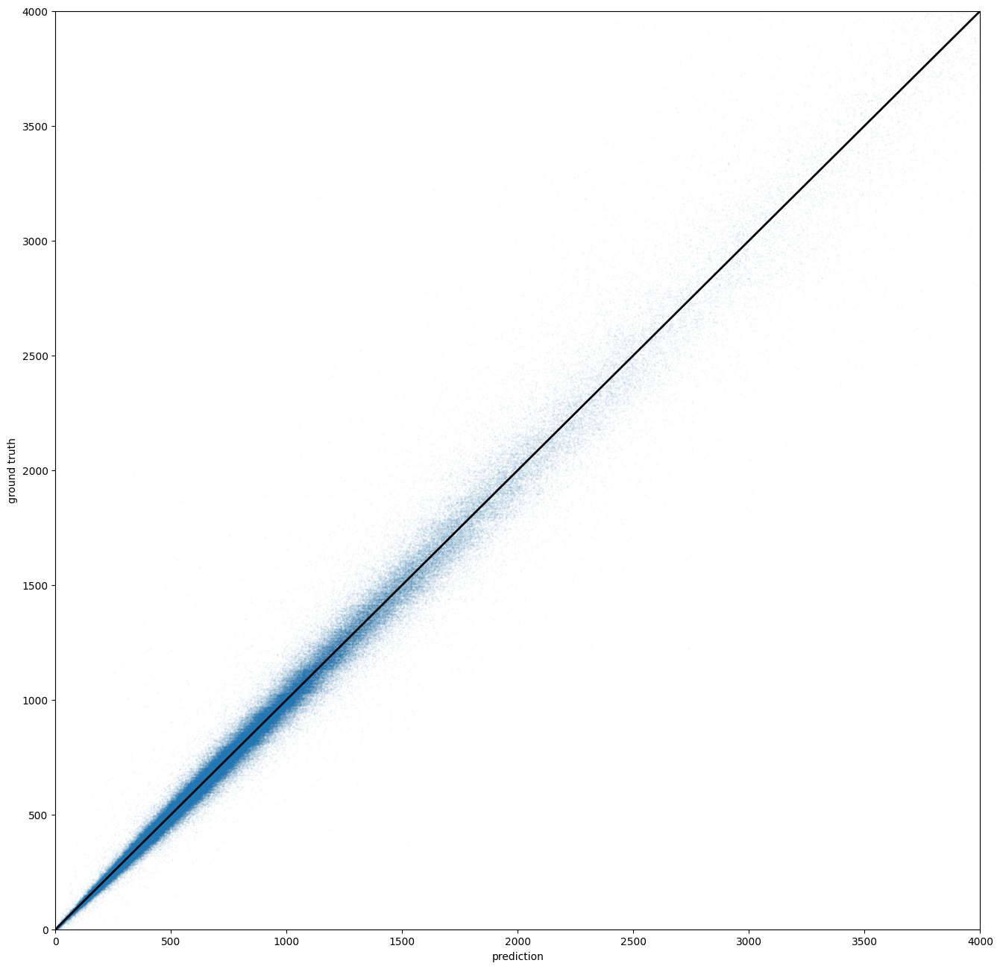

In [63]:
plt.scatter(np.exp(ypred), np.exp(y_v), s=0.1, alpha=0.1)
plt.plot([0, 4000], [0, 4000], 'k-', lw=2)  # add y=x line
plt.xlabel("prediction")
plt.ylabel("ground truth")
plt.ylim((0, 4000))
plt.xlim((0, 4000))
plt.show()


As we can see, it follows closely! Thats exactly what we want!